# Gianluca Cavallaro - Mat. 826049

Analyze and compare two geospatial datasets
The choice of the datasets is free, but a few constraints must be observed:

*   Use at least 2 different datasets (e.g. model and observations, n different models, 2 different observational datasets, etc.)
*   Perform at least 1 operation in space and 1 operation in time (e.g. aggregation, normalization, resampling, regridding, etc.)
*   Display data both as a function of space and time (time series and maps)
*   Apply some sort of statistical analysis on the data (arrange the data according to some pdf, hypothesis testing, time series analysis, detection of trends, classification, pattern detection, ...)

In [1]:
#@markdown # Install required packages
#@markdown ##### You have to restart the runtime after running this cell to load the correct packages versions

%%capture
!apt-get install -qq libgdal-dev libproj-dev
!pip install --no-binary shapely shapely --force
!pip install cartopy
!pip install geopandas
!pip install nc_time_axis
!pip install hvplot
!pip install geoviews
!pip install cmocean
!pip install numpy==1.23.5

In [2]:
#@markdown # Libraries and packages import

%%capture
import pandas as pd
import numpy as np
from numpy.random import seed
from numpy.random import randn
import xarray as xr
import scipy
from scipy.stats import pearsonr

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import datetime
import warnings

import matplotlib as mpl
from matplotlib import pyplot as plt
import seaborn as sns
import hvplot.xarray
import cmocean

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from prophet import Prophet
from prophet.plot import add_changepoints_to_plot

from IPython.display import Image
seed(1)

%matplotlib inline
%config InlinedBackend.figure_format = 'retina'
warnings.simplefilter(action='ignore')

In [3]:
#@markdown # Setup
#@markdown ##### If you want to run this notebook make sure to change the current working directory inside this cell!

%%capture
%cd /content/gdrive/MyDrive/Colab Notebooks/BigDataGeography/GIS_Project

# Load the datasets

In [4]:
# Sea surface temperature dataset
sea_data = xr.open_dataset('sst.mnmean.nc')

# Application of a mask for land areas
mask  = xr.open_dataset('lsmask.nc')
sea_data['sst'] = sea_data.sst.where(mask.mask.isel(time=0) == 1)

# Change longitude range in [-180,+180]
sea_data.coords['lon'] = (sea_data.coords['lon'] + 180) % 360 - 180
sea_data = sea_data.sortby(sea_data.lon)

In [5]:
# Ice concentration dataset
ice_data = xr.open_dataset('icec.mnmean.nc')

# Change longitude range in [-180,+180]
ice_data.coords['lon'] = (ice_data.coords['lon'] + 180) % 360 - 180
ice_data = ice_data.sortby(sea_data.lon)

The data considered for the following analysis are taken from NOAA, the National Oceanic and Atmospheric Administration. Among the open source datasets made available by the association, the two datasets relating to [sea surface temperature and ice concentration](https://psl.noaa.gov/data/gridded/data.noaa.oisst.v2.html) were selected. The aim of the following project is to propose an analysis of these two datasets, trying to search the data for a possible correlation between these two variables.

# Data Exploration - Sea Temperature

In [6]:
sea_data

<xarray.Dataset>
Dimensions:    (lat: 180, lon: 360, time: 494, nbnds: 2)
Coordinates:
  * lat        (lat) float32 89.5 88.5 87.5 86.5 ... -86.5 -87.5 -88.5 -89.5
  * lon        (lon) float32 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * time       (time) datetime64[ns] 1981-12-01 1982-01-01 ... 2023-01-01
Dimensions without coordinates: nbnds
Data variables:
    sst        (time, lat, lon) float32 -1.79 -1.79 -1.79 -1.79 ... nan nan nan
    time_bnds  (time, nbnds) datetime64[ns] ...
Attributes:
    title:          NOAA Optimum Interpolation (OI) SST V2
    Conventions:    CF-1.0
    history:        Wed Apr  6 13:47:45 2005: ncks -d time,0,278 SAVEs/sst.mn...
    comments:       Data described in  Reynolds, R.W., N.A. Rayner, T.M.\nSmi...
    platform:       Model
    source:         NCEP Climate Modeling Branch
    institution:    National Centers for Environmental Prediction
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    dataset_title:  NOAA Optimum Interpolation (OI) SST V2
    source_url:     http://www.emc.ncep.noaa.gov/research/cmb/sst_analysis/

In [7]:
print('The minimum value for sea temperature is', sea_data.sst.min().item(), 'and the maximum value is', sea_data.sst.max().item())

The minimum value for sea temperature is -1.7899999618530273 and the maximum value is 35.55999755859375


The sea_data dataset contains global sea surface temperature values ​​at monthly granularity, from 1982 to 2022. 

## Maps

First of all, a global map for a specific point in time is analysed. The time can be chosen by modifying the `TIME` value in the cell below:

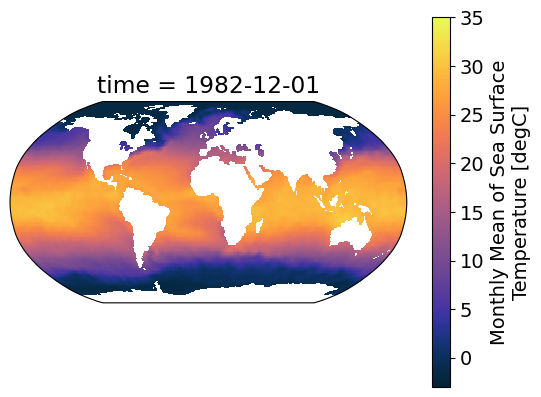

In [64]:
#@markdown ## Generate plot for a specific timestep
#@markdown ##### From 0 (1981-12-01) to 493 (2023-01-01)

TIME = 12 #@param {type:"number"}

proj = ccrs.PlateCarree()
sea_data.sst.isel(time=TIME).plot(transform=ccrs.PlateCarree(),
                                  subplot_kws={'projection': ccrs.Robinson()},
                                  cmap=cmocean.cm.thermal,
                                  vmin=-3,
                                  vmax=35)

The colormap chosen for representing sea temperature values is the `thermal` colormap from the `cmocean` library, a divergent colormap able to convey the temperature information by using warm colors for high temperatures and cold colors for low temperatures.

As expected, in every period of the year there are rather high surface temperatures in the equatorial area, which gradually decrease moving towards the poles, where they reach temperatures around 0°C.

It is possible to analyze the trend of temperatures throughout the year through a monthly average.

In [9]:
# Average monthly sea temperature
monthly_sea = sea_data.groupby('time.month').mean('time')

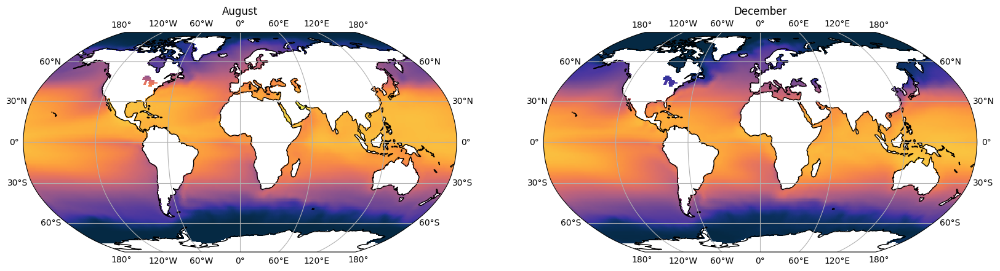

In [10]:
#@markdown ## Generate plot for a specific month and comparison between months
#@markdown ##### Choose number from 0 (January) to 11 (December)

months = {0: 'January', 1: 'February', 2: 'March', 3: 'April', 4: 'May', 5: 'June',
          6: 'July', 7: 'August', 8: 'September', 9: 'October', 10: 'November',
          11: 'December',}

MONTH1 = 7 #@param {type:"number"}
MONTH2 = 11 #@param {type:"number"}

fig = plt.figure(figsize=(20,8))
subplots = (1,2)
n_panels = subplots[0] * subplots[1]

# MONTH1
g1 = monthly_sea.isel(month=MONTH1)
ax = fig.add_subplot(subplots[0], subplots[1], 1, projection=ccrs.Robinson())
ax.set_title(months[MONTH1])
ax.set_global()
mm = ax.pcolormesh(g1.lon, g1.lat, g1.sst, transform=ccrs.PlateCarree(), vmin=-3, vmax=35, cmap=cmocean.cm.thermal)
ax.coastlines()
ax.gridlines(draw_labels=True)

# MONTH2
g2 = monthly_sea.isel(month=MONTH2)
ax = fig.add_subplot(subplots[0], subplots[1], 2, projection=ccrs.Robinson())
ax.set_title(months[MONTH2])
ax.set_global()
mm = ax.pcolormesh(g2.lon, g2.lat, g2.sst, transform=ccrs.PlateCarree(), vmin=-3, vmax=35, cmap=cmocean.cm.thermal)
ax.coastlines()
ax.gridlines(draw_labels=True)

plt.show()
plt.close()

The differences are not particularly evident to the naked eye, but it is possible to notice some variations between the summer and winter months, such as, for example, the temperature of the Mediterranean Sea or that of large continental water basins.

## Time series

Another possible way to represent data is through a time series. The time series at monthly and annual granularity of the global average surface temperature are presented below. A weighted average is used to take into account the different extension of the grid cells depending on the latitude.

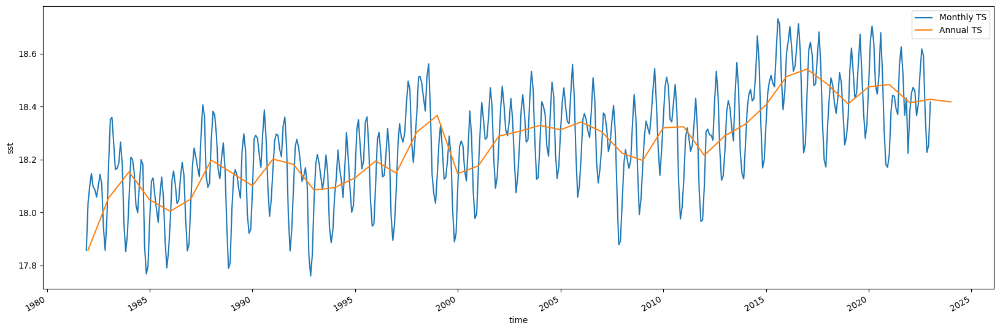

In [11]:
plt.figure(figsize=(20, 6))
sst_weights = np.cos(np.deg2rad(sea_data.sst.lat))
sst_weighted = sea_data.sst.weighted(sst_weights)
weighted_mean = sst_weighted.mean(("lon", "lat"))

# Monthly weighted average time series
weighted_mean.plot()

# Annual weighted average time series
weighted_mean.resample(time="Y").mean().plot()

plt.legend(["Monthly TS", "Annual TS"], loc=0)
plt.show()

From a first look at the time series, it is possible to note how the temperature trend is subject to seasonality and how the trend is growing globally. More in-depth analyzes on the time series will be proposed later.

## Anomalies

Another important analysis is that on temperature anomalies. To compute them, we must first select a reference period for calculating the normals. The most common choice is that of the period 1981-2010.

In [12]:
# Compute the normals - [1981-2010]

sea_normals = sea_data.sel(time=slice("1981-01-01", "2010-12-01")).groupby('time.month').mean()

In [13]:
sea_anomalies = sea_data.groupby('time.month')-sea_normals
sea_anomalies

<xarray.Dataset>
Dimensions:  (lat: 180, lon: 360, time: 494)
Coordinates:
  * lat      (lat) float32 89.5 88.5 87.5 86.5 85.5 ... -86.5 -87.5 -88.5 -89.5
  * lon      (lon) float32 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * time     (time) datetime64[ns] 1981-12-01 1982-01-01 ... 2023-01-01
    month    (time) int64 12 1 2 3 4 5 6 7 8 9 10 ... 3 4 5 6 7 8 9 10 11 12 1
Data variables:
    sst      (time, lat, lon) float32 7.153e-07 7.153e-07 7.153e-07 ... nan nan

In [14]:
print('The minimum anomaly is', sea_anomalies.sst.min().item(), 'and the maximum anomaly is', sea_anomalies.sst.max().item())

The minimum anomaly is -10.5137939453125 and the maximum anomaly is 8.51551628112793


We can see how anomalies of up to -10°C and +8°C have been recorded somewhere in the world.

We propose again maps similar to those previously shown on the anomaly data. The `seismic` colormap was selected in order to highlight positive and negative anomalies:

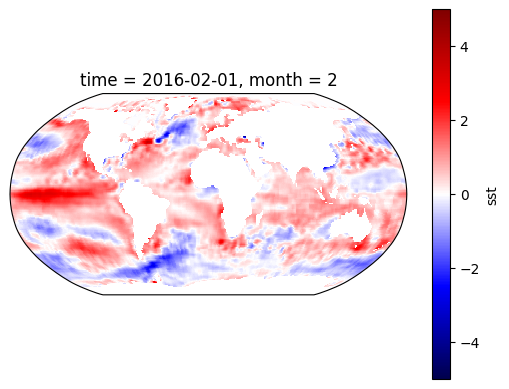

In [15]:
#@markdown ## Generate plot for a specific timestep
#@markdown ##### From 0 (1981-12-01) to 493 (2023-01-01)

TIME = 410 #@param {type:"number"}

proj = ccrs.PlateCarree()
sea_anomalies.sst.isel(time=TIME).plot(transform=ccrs.PlateCarree(),
                                  subplot_kws={'projection': ccrs.Robinson()},
                                  cmap=mpl.cm.seismic,
                                  vmin=-5,
                                  vmax=5)

Focusing on the last few years available, it is easy to notice positive anomalies for a large part of the sea surface. In particular, the Arctic area shows important positive anomalies, while negative anomalies can be seen around the Antarctic area, a sign of how warming in this area follows a different trend than in the rest of the planet. As we will see going forward, the pattern in the Southern Ocean has been shown to be different than in the rest of the world. In the last 30 years, in some regions the surface temperature of the sea has been decreasing, in contrast with the global trend: [as reported by various articles](https://newatlas.com/environment/southern-ocean-cooling-sea-ice/), the reason for this behavior is linked to the increase in ice masses in some areas of the Antarctic region, leading to a cooling of surface temperatures.



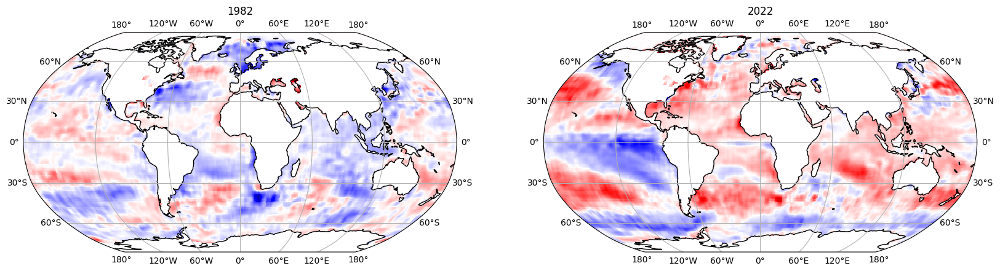

In [16]:
#@markdown ## Comparison between 1982 and 2022
#@markdown ##### In this case it is noteworthy to show the differences between the first and last year available in the dataset. Below, anomalies for the month of January are shown:

# Comparison between the first (1982) and last (2022) year

fig = plt.figure(figsize=(20,8))
subplots = (1,2)
n_panels = subplots[0] * subplots[1]

# 1982
sea = sea_anomalies.sel(time='1982-01-01')
ax = fig.add_subplot(subplots[0], subplots[1], 1, projection=ccrs.Robinson())
ax.set_title('1982')
ax.set_global()
mm = ax.pcolormesh(sea.lon, sea.lat, sea.sst, transform=ccrs.PlateCarree(), 
                   vmin=-5, vmax=5, cmap=mpl.cm.seismic)
ax.coastlines()
ax.gridlines(draw_labels=True)

# 2022
sea = sea_anomalies.sel(time='2022-01-01')
ax = fig.add_subplot(subplots[0], subplots[1], 2, projection=ccrs.Robinson())
ax.set_title('2022')
ax.set_global()
mm = ax.pcolormesh(sea.lon, sea.lat, sea.sst, transform=ccrs.PlateCarree(), 
                   vmin=-5, vmax=5, cmap=mpl.cm.seismic)
ax.coastlines()
ax.gridlines(draw_labels=True)

plt.show()
plt.close()

It is possible to see how, globally, temperature anomalies became positive in the last years.

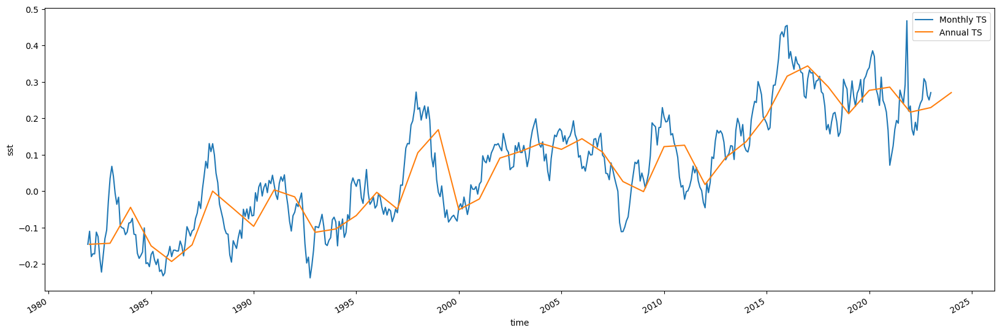

In [17]:
plt.figure(figsize=(20, 6))
sst_weights = np.cos(np.deg2rad(sea_anomalies.sst.lat))
sst_weighted = sea_anomalies.sst.weighted(sst_weights)
weighted_mean = sst_weighted.mean(("lon", "lat"))

# Monthly weighted average time series
weighted_mean.plot()

# Annual weighted average time series
weighted_mean.resample(time="Y").mean().plot()

plt.legend(["Monthly TS", "Annual TS"], loc=0)
plt.show()

Also by analyzing the time series we can see a significant increase in the average anomaly at a global level.

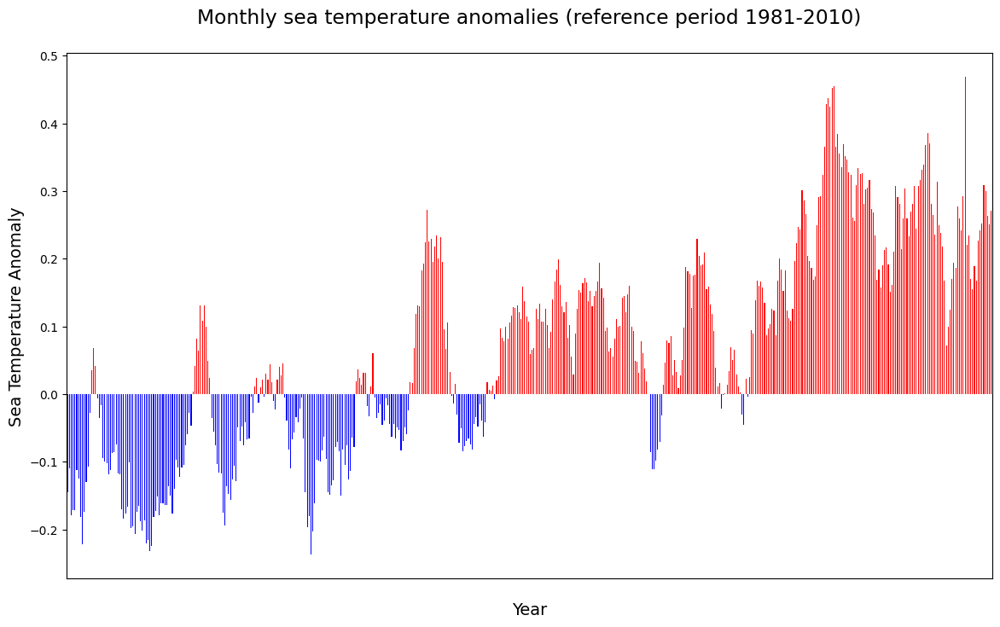

In [18]:
#@markdown ## Generate monthly global average anomaly

# Compute the weights and the weighted average
sst_weights = np.cos(np.deg2rad(sea_anomalies.sst.lat))
df = sea_anomalies
df = df.sst.weighted(sst_weights).mean(dim=['lat','lon']) # monthly global weighted average

df_year = df.groupby('time.year').mean() # annual global weighted average

# Convert to dataframe for display purpose
df = df.to_dataframe()
df_year = df_year.to_dataframe()

df['positive'] = df['sst'] > 0
df_year['positive'] = df_year['sst'] > 0

################################################################################

plt.rcParams.update({'font.size': 14}) # must set in top
ax = df['sst'].plot(figsize=(14,8),
               kind='bar',
               color=df.positive.map({True: 'red', False: 'blue'}),
               fontsize=10,
               xlabel='\nYear',
               xticks=[],
               ylabel='Sea Temperature Anomaly',
               title='Monthly sea temperature anomalies (reference period 1981-2010)\n',
               )

Here we note how in recent years, the global anomaly has always been strongly positive.

# Data Exploration - Ice concentration

In [19]:
ice_data

<xarray.Dataset>
Dimensions:    (lat: 180, lon: 360, time: 494, nbnds: 2)
Coordinates:
  * lat        (lat) float32 89.5 88.5 87.5 86.5 ... -86.5 -87.5 -88.5 -89.5
  * lon        (lon) float32 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * time       (time) datetime64[ns] 1981-12-01 1982-01-01 ... 2023-01-01
Dimensions without coordinates: nbnds
Data variables:
    icec       (time, lat, lon) float32 ...
    time_bnds  (time, nbnds) datetime64[ns] ...
Attributes:
    title:          NOAA Optimum Interpolation (OI) SST V2
    Conventions:    CF-1.0
    history:        Wed Apr  6 13:51:42 2005: ncks -d time,0,278 SAVEs/icec.m...
    comments:       Data described in  Reynolds, R.W., N.A. Rayner, T.M.\nSmi...
    platform:       Model
    source:         NCEP Climate Modeling Branch
    institution:    National Centers for Environmental Prediction
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    NCO:            4.0.0
    dataset_title:  NOAA Optimum Interpolation (OI) SST V2
    source_url:     http://www.emc.ncep.noaa.gov/research/cmb/sst_analysis/

In [20]:
print('The minimum value for ice concentration is', ice_data.icec.min().item(), 'and the maximum value is', ice_data.icec.max().item())

The minimum value for ice concentration is 0.0 and the maximum value is 100.00999450683594


As for the ice_data dataset, it contains global ice concentration values ​​at monthly granularity. The values ​​shown refer to the percentage of sea surface covered by ice masses: 0 means that there is no ice; 100 means that ice convers the entire sea surface.

## Maps

We propose the same maps created previously. In this case the colormap used was the `ice` colormap from `cmocean`, which was created precisely to show this type of data.

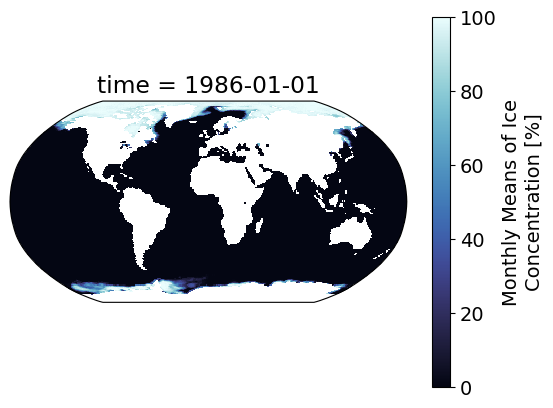

In [21]:
#@markdown ## Generate plot for a specific timestep
#@markdown ##### From 0 (1981-12-01) to 493 (2023-01-01)

TIME = 49 #@param {type:"number"}

proj = ccrs.PlateCarree()
ice_data.icec.isel(time=TIME).plot(transform=ccrs.PlateCarree(),
                                   subplot_kws={'projection': ccrs.Robinson()},
                                   cmap=cmocean.cm.ice,
                                   vmin=0,
                                   vmax=100)

Clearly, the ice masses are concentrated at the poles, where some areas have the entire surface covered in ice. I'm gonna to focus on these area below.

In [22]:
# Average monthly sea temperature
monthly_ice = ice_data.groupby('time.month').mean('time')

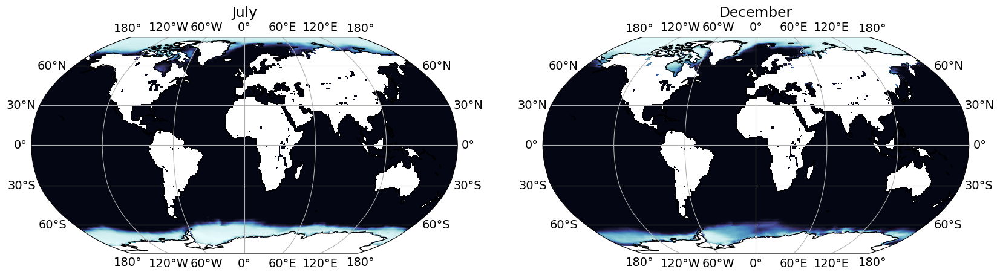

In [23]:
#@markdown ## Generate plot for a specific month and comparison between months
#@markdown ##### Choose number from 0 (January) to 11 (December)

months = {0: 'January', 1: 'February', 2: 'March', 3: 'April', 4: 'May', 5: 'June',
          6: 'July', 7: 'August', 8: 'September', 9: 'October', 10: 'November',
          11: 'December',}

MONTH1 = 6 #@param {type:"number"}
MONTH2 = 11 #@param {type:"number"}

fig = plt.figure(figsize=(20,8))
subplots = (1,2)
n_panels = subplots[0] * subplots[1]

# MONTH1
g1 = monthly_ice.isel(month=MONTH1)
ax = fig.add_subplot(subplots[0], subplots[1], 1, projection=ccrs.Robinson())
ax.set_title(months[MONTH1])
ax.set_global()
mm = ax.pcolormesh(g1.lon, g1.lat, g1.icec, transform=ccrs.PlateCarree(), 
                   vmin=0, vmax=100, cmap=cmocean.cm.ice)
ax.coastlines()
ax.gridlines(draw_labels=True)

# MONTH2
g2 = monthly_ice.isel(month=MONTH2)
ax = fig.add_subplot(subplots[0], subplots[1], 2, projection=ccrs.Robinson())
ax.set_title(months[MONTH2])
ax.set_global()
mm = ax.pcolormesh(g2.lon, g2.lat, g2.icec, transform=ccrs.PlateCarree(), 
                   vmin=0, vmax=100, cmap=cmocean.cm.ice)
ax.coastlines()
ax.gridlines(draw_labels=True)

plt.show()
plt.close()

Comparing the monthly values, we can note the inversion between the seasons at the two poles: in the central months of the year (boral summer, austral winter) the ice concentration is reduced at the north pole and more accentuated at the south pole. Viceversa, in the final months of the year (boral winter, austral summer) the opposite behavior is noted.

## Time series

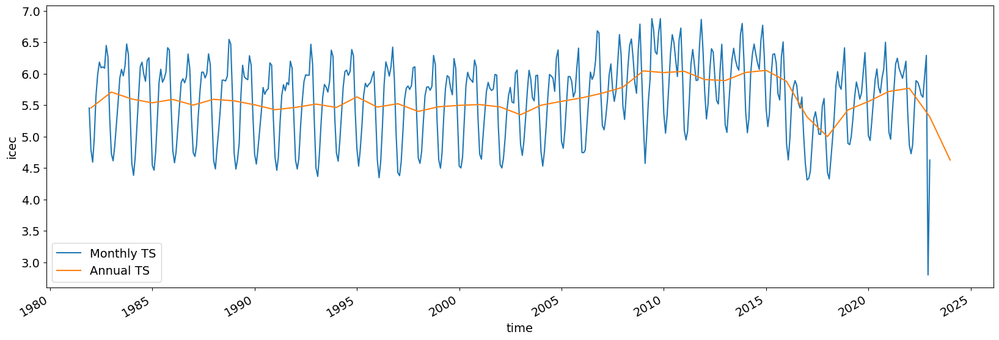

In [24]:
plt.figure(figsize=(20, 6))
ice_weights = np.cos(np.deg2rad(ice_data.icec.lat))
ice_weighted = ice_data.icec.weighted(ice_weights)
weighted_mean = ice_weighted.mean(("lon", "lat"))

# Monthly weighted average time series
weighted_mean.plot()

# Annual weighted average time series
weighted_mean.resample(time="Y").mean().plot()

plt.legend(["Monthly TS", "Annual TS"], loc=0)
plt.show()

Analyzing the time series we can instead notice a predictable opposite trend with respect to the temperature, especially in recent years.

We notice a particularly extreme value in December 2022. After some research it seems to be an incorrect value. Indeed, although December 2022 was the [eighth lowest December in the satellite record](https://climate.copernicus.eu/sea-ice-cover-december-2022) (which starts in 1979), it is still higher than the value recorded, for example, in December 2016. It is possible that the values ​​for this month are still not validated yet. To prevent analyzes from being affected by an incorrect value, it is removed from the dataset.

In [25]:
ice_data = ice_data.sel(time=slice('1981-12-01', '2022-11-01'))

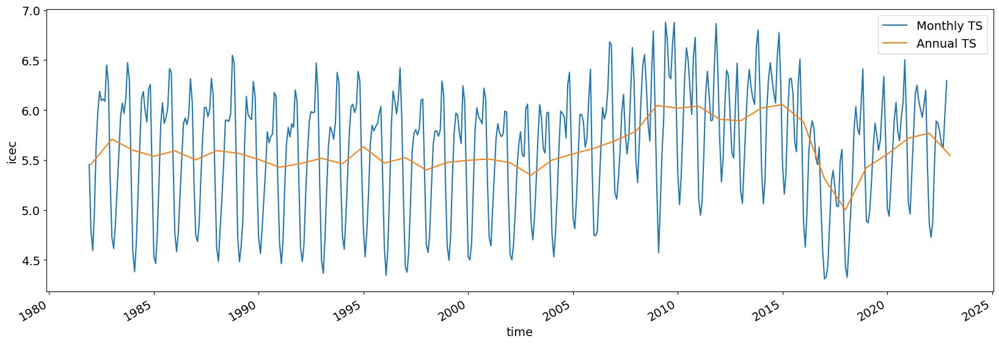

In [26]:
plt.figure(figsize=(20, 6))
ice_weights = np.cos(np.deg2rad(ice_data.icec.lat))
ice_weighted = ice_data.icec.weighted(ice_weights)
weighted_mean = ice_weighted.mean(("lon", "lat"))

# Monthly weighted average time series
weighted_mean.plot()

# Annual weighted average time series
weighted_mean.resample(time="Y").mean().plot()

plt.legend(["Monthly TS", "Annual TS"], loc=0)
plt.show()

We can that in the last years ice concentration began to drop, with a negative peak aroud 2017.

## Anomalies

Also in this case we are going to calculate the anomalies.

In [27]:
# Compute the normals - [1981-2010]

ice_normals = ice_data.sel(time=slice("1981-01-01", "2010-12-01")).groupby('time.month').mean()
ice_anomalies = ice_data.groupby('time.month')-ice_normals
ice_anomalies

<xarray.Dataset>
Dimensions:  (lat: 180, lon: 360, time: 492)
Coordinates:
  * lat      (lat) float32 89.5 88.5 87.5 86.5 85.5 ... -86.5 -87.5 -88.5 -89.5
  * lon      (lon) float32 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * time     (time) datetime64[ns] 1981-12-01 1982-01-01 ... 2022-11-01
    month    (time) int64 12 1 2 3 4 5 6 7 8 9 10 11 ... 1 2 3 4 5 6 7 8 9 10 11
Data variables:
    icec     (time, lat, lon) float32 0.1663 0.1663 0.1663 ... nan nan nan

In [28]:
print('The minimum anomaly is', ice_anomalies.icec.min().item(), 'and the maximum anomaly is', ice_anomalies.icec.max().item())

The minimum anomaly is -100.00167083740234 and the maximum anomaly is 93.33333587646484


We can see anomalies between -100 and 93, a sign of how in certain cases the total disappearance of the ice masses has occurred in some areas and in other cases ice has arrived in areas previously devoid of ice.

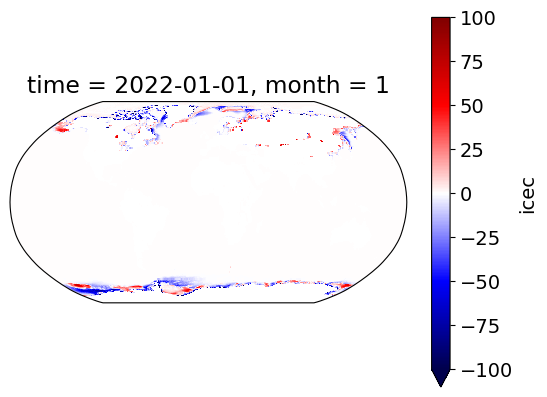

In [29]:
#@markdown ## Generate plot for a specific timestep
#@markdown ##### From 0 (1981-12-01) to 491 (2022-11-01)

TIME = 481 #@param {type:"number"}

proj = ccrs.PlateCarree()
ice_anomalies.icec.isel(time=TIME).plot(transform=ccrs.PlateCarree(),
                                  subplot_kws={'projection': ccrs.Robinson()},
                                  cmap=mpl.cm.seismic,
                                  vmin=-100,
                                  vmax=100)

Looking at specific timesteps, we can see generally negative anomalies in the Arctic, while the decreasing trend is much less evident in Antarctica, where several positive anomalies are recorded.

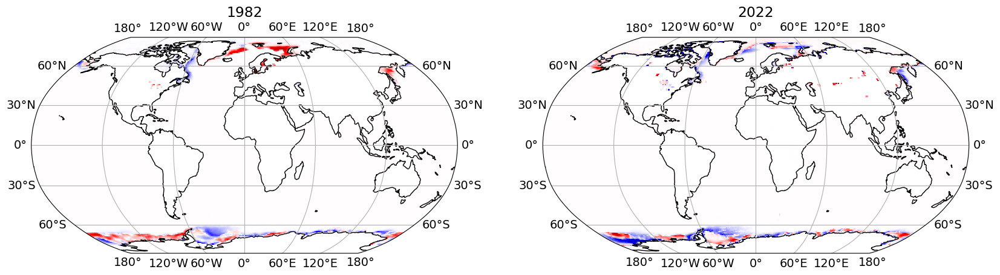

In [30]:
#@markdown ## Comparison between 1982 and 2022

# Comparison between the first (1982) and last (2022) year

fig = plt.figure(figsize=(20,8))
subplots = (1,2)
n_panels = subplots[0] * subplots[1]

# 1982
ice = ice_anomalies.sel(time='1982-01-01')
ax = fig.add_subplot(subplots[0], subplots[1], 1, projection=ccrs.Robinson())
ax.set_title('1982')
ax.set_global()
mm = ax.pcolormesh(ice.lon, ice.lat, ice.icec, transform=ccrs.PlateCarree(), 
                   vmin=-100, vmax=100, cmap=mpl.cm.seismic)
ax.coastlines()
ax.gridlines(draw_labels=True)

# 2022
ice = ice_anomalies.sel(time='2022-01-01')
ax = fig.add_subplot(subplots[0], subplots[1], 2, projection=ccrs.Robinson())
ax.set_title('2022')
ax.set_global()
mm = ax.pcolormesh(ice.lon, ice.lat, ice.icec, transform=ccrs.PlateCarree(), 
                   vmin=-100, vmax=100, cmap=mpl.cm.seismic)
ax.coastlines()
ax.gridlines(draw_labels=True)

plt.show()
plt.close()

Also in this case, by showing the differences between the first and last year in the dataset, it is possible to notice a predominance of negative anomalies in the last year.

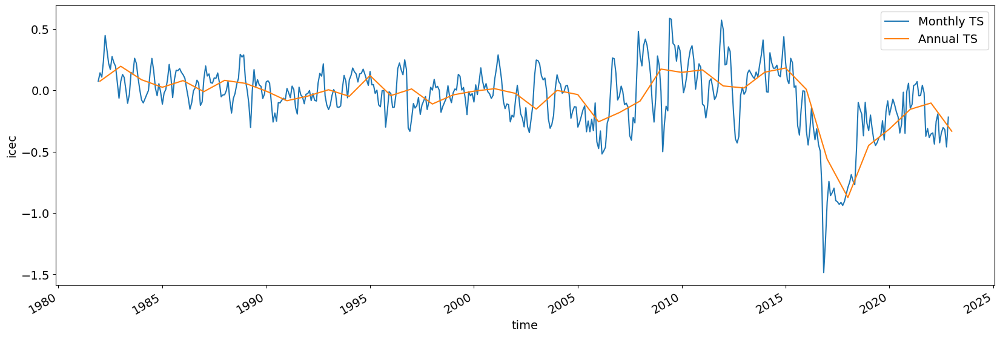

In [31]:
plt.figure(figsize=(20, 6))
ice_weights = np.cos(np.deg2rad(ice_anomalies.icec.lat))
ice_weighted = ice_anomalies.icec.weighted(ice_weights)
weighted_mean = ice_weighted.mean(("lon", "lat"))

# Monthly weighted average time series
weighted_mean.plot()

# Annual weighted average time series
weighted_mean.resample(time="Y").mean().plot()

plt.legend(["Monthly TS", "Annual TS"], loc=0)
plt.show()

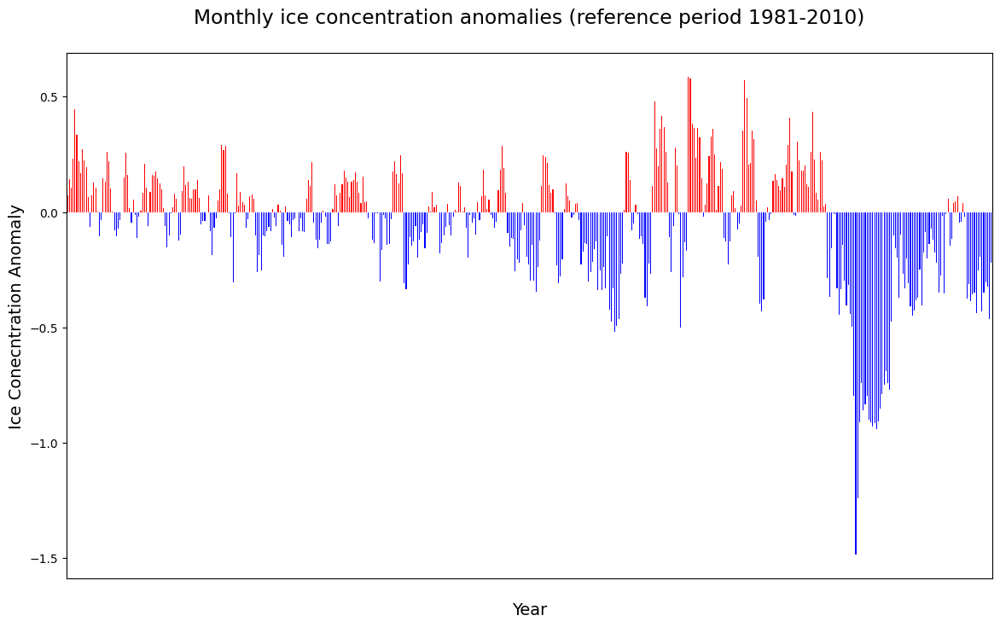

In [32]:
#@markdown ## Generate monthly global average anomaly

# Compute the weights and the weighted average
ice_weights = np.cos(np.deg2rad(ice_anomalies.icec.lat))
df = ice_anomalies
df = df.icec.weighted(ice_weights).mean(dim=['lat','lon']) # monthly global weighted average

df_year = df.groupby('time.year').mean() # annual global weighted average

# Convert to dataframe for display purpose
df = df.to_dataframe()
df_year = df_year.to_dataframe()

df['positive'] = df['icec'] > 0
df_year['positive'] = df_year['icec'] > 0

################################################################################

plt.rcParams.update({'font.size': 14}) # must set in top
ax = df['icec'].plot(figsize=(14,8),
               kind='bar',
               color=df.positive.map({True: 'red', False: 'blue'}),
               fontsize=10,
               xlabel='\nYear',
               xticks=[],
               ylabel='Ice Conecntration Anomaly',
               title='Monthly ice concentration anomalies (reference period 1981-2010)\n',
               )

Looking at the previous two graphs we can see how the anomalies in recent years are almost completely negative.

# FOCUS: North and South pole

So far we have considered the entire dataset. However, the effect of climate change on ice concentration is most pronounced at the poles. Therefore, let's go for a more in-depth analysis of these geographical areas only.

### Artic

As shown above, there is a difference between the first and last year in the dataset. Let's show this difference in the polar areas, starting from the sea surface temperature in 1982 and in 2022 and dividing the summer and winter seasons.

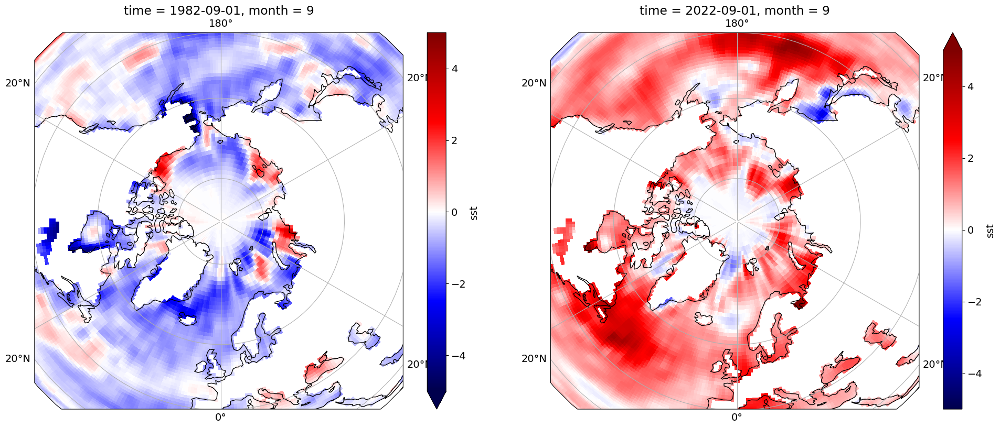

In [33]:
#@markdown ## Sea temperature - Arctic summer - 1982 vs. 2022
#@markdown #### Arctic summer is in september

extent = [180, -180 , 40 , 90]

proj = ccrs.Orthographic(central_longitude=0.0, central_latitude=90)
fig, ax = plt.subplots(1, 2, figsize=(20, 8), subplot_kw={'projection': proj})
ax[0].set_extent(extent, ccrs.PlateCarree())
ax[1].set_extent(extent, ccrs.PlateCarree())

# 1982
sea_anomalies.sst.isel(time=9).plot(ax=ax[0], transform=ccrs.PlateCarree(),
                                              vmin=-5,
                                              vmax=5,
                                              cmap=mpl.cm.seismic)
ax[0].coastlines()
ax[0].gridlines(draw_labels=True)

# 2022
sea_anomalies.sst.isel(time=489).plot(ax=ax[1], transform=ccrs.PlateCarree(),
                                              vmin=-5,
                                              vmax=5,
                                              cmap=mpl.cm.seismic)
ax[1].coastlines()
ax[1].gridlines(draw_labels=True)

fig.tight_layout()

plt.show()
plt.close()

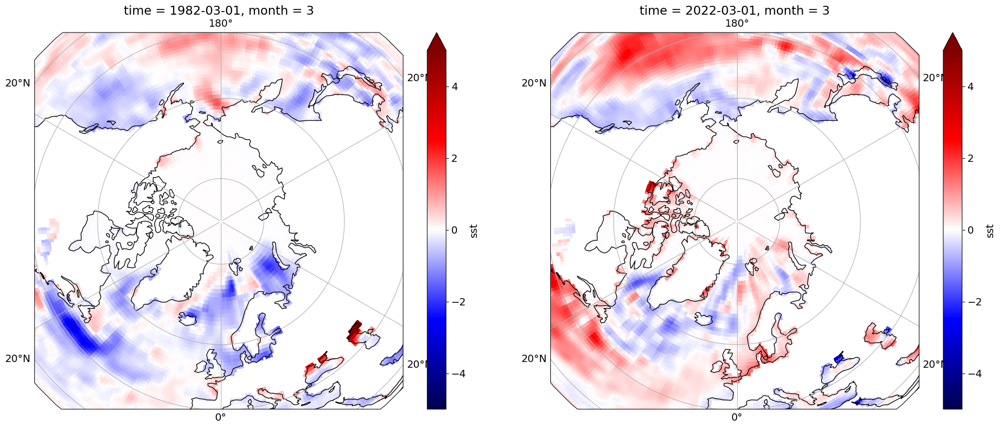

In [34]:
#@markdown ## Sea temperature - Arctic winter - 1982 vs. 2022
#@markdown #### Arctic summer is in march

extent = [180, -180 , 40 , 90]

proj = ccrs.Orthographic(central_longitude=0.0, central_latitude=90)
fig, ax = plt.subplots(1, 2, figsize=(20, 8), subplot_kw={'projection': proj})
ax[0].set_extent(extent, ccrs.PlateCarree())
ax[1].set_extent(extent, ccrs.PlateCarree())

# 1982
sea_anomalies.sst.isel(time=3).plot(ax=ax[0], transform=ccrs.PlateCarree(),
                                              vmin=-5,
                                              vmax=5,
                                              cmap=mpl.cm.seismic)
ax[0].coastlines()
ax[0].gridlines(draw_labels=True)

# 2022
sea_anomalies.sst.isel(time=483).plot(ax=ax[1], transform=ccrs.PlateCarree(),
                                              vmin=-5,
                                              vmax=5,
                                              cmap=mpl.cm.seismic)
ax[1].coastlines()
ax[1].gridlines(draw_labels=True)

fig.tight_layout()

plt.show()
plt.close()

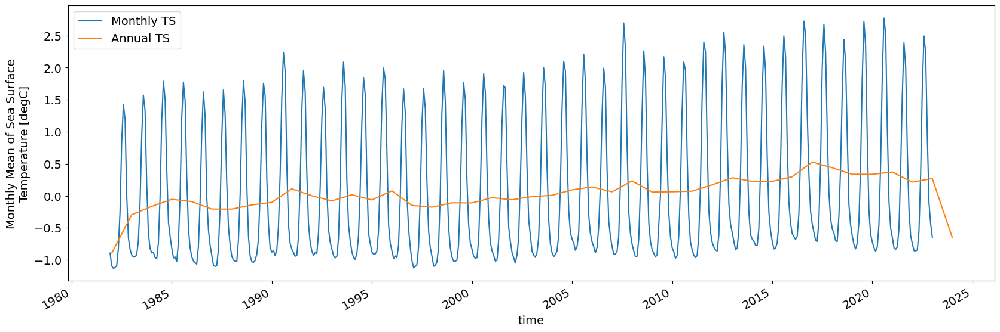

In [35]:
plt.figure(figsize=(20, 6))
artic_weighted = sea_data.isel(lat=slice(0,24)).sst.weighted(sst_weights).mean(("lon", "lat"), keep_attrs=True)

# Monthly weighted average time series
artic_weighted.plot()

# Annual weighted average time series
artic_weighted.resample(time="Y").mean().plot()

plt.legend(["Monthly TS", "Annual TS"], loc=0)
plt.show()

The increase in temperature is particularly evident especially in the summer season. In fact, even looking at the time series, we can see how, over time, the minimum temperatures during the winter remain just above -1°C while the maximum temperatures, in the summer, have gone from 1.5°C in the 80s to over 2.5°C in recent years.

Let's do the same thing for ice concentration:

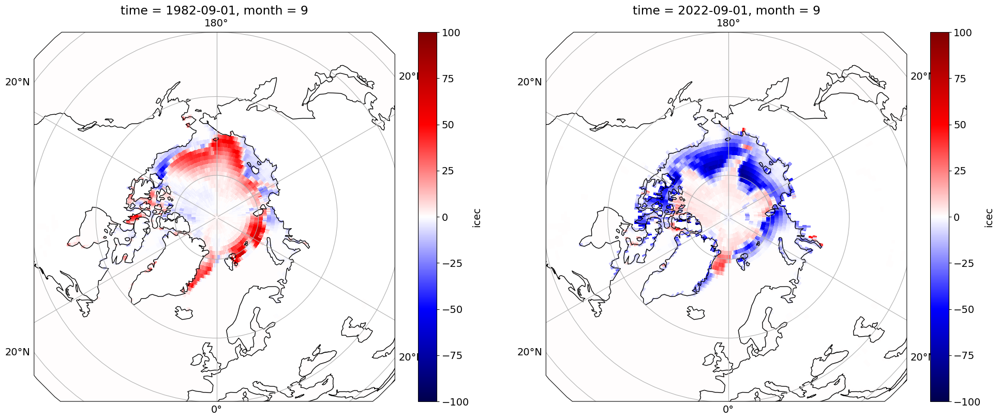

In [36]:
#@markdown ## Comparison between Artic summer - 1982 vs. 2022

extent = [180, -180 , 40 , 90]

proj = ccrs.Orthographic(central_longitude=0.0, central_latitude=90)
fig, ax = plt.subplots(1, 2, figsize=(20, 8), subplot_kw={'projection': proj})
ax[0].set_extent(extent, ccrs.PlateCarree())
ax[1].set_extent(extent, ccrs.PlateCarree())

# 1982
ice_anomalies.icec.isel(time=9).plot(ax=ax[0], transform=ccrs.PlateCarree(),
                                              vmin=-100,
                                              vmax=100,
                                              cmap=mpl.cm.seismic)
ax[0].coastlines()
ax[0].gridlines(draw_labels=True)

# 2022
ice_anomalies.icec.isel(time=489).plot(ax=ax[1], transform=ccrs.PlateCarree(),
                                              vmin=-100,
                                              vmax=100,
                                              cmap=mpl.cm.seismic)
ax[1].coastlines()
ax[1].gridlines(draw_labels=True)

fig.tight_layout()

plt.show()
plt.close()

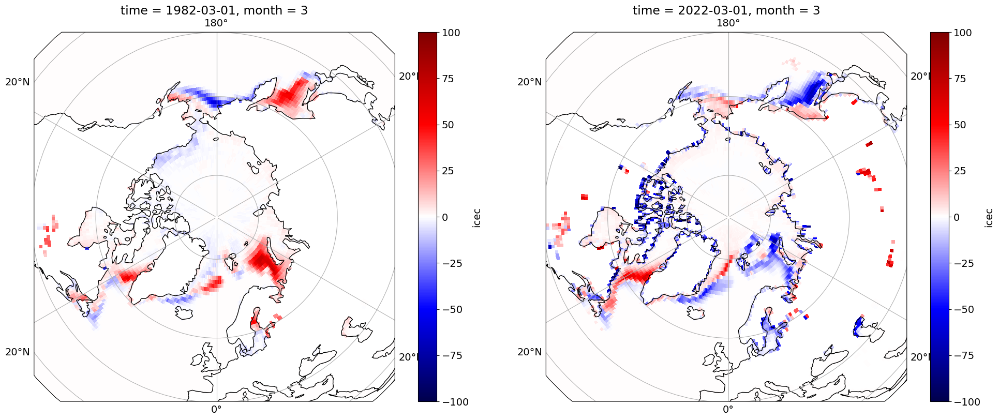

In [37]:
#@markdown ## Comparison between Artic winter - 1982 vs. 2022

extent = [180, -180 , 40 , 90]

proj = ccrs.Orthographic(central_longitude=0.0, central_latitude=90)
fig, ax = plt.subplots(1, 2, figsize=(20, 8), subplot_kw={'projection': proj})
ax[0].set_extent(extent, ccrs.PlateCarree())
ax[1].set_extent(extent, ccrs.PlateCarree())

# 1982
ice_anomalies.icec.isel(time=3).plot(ax=ax[0], transform=ccrs.PlateCarree(),
                                              vmin=-100,
                                              vmax=100,
                                              cmap=mpl.cm.seismic)
ax[0].coastlines()
ax[0].gridlines(draw_labels=True)

# 2022
ice_anomalies.icec.isel(time=483).plot(ax=ax[1], transform=ccrs.PlateCarree(),
                                              vmin=-100,
                                              vmax=100,
                                              cmap=mpl.cm.seismic)
ax[1].coastlines()
ax[1].gridlines(draw_labels=True)

fig.tight_layout()

plt.show()
plt.close()

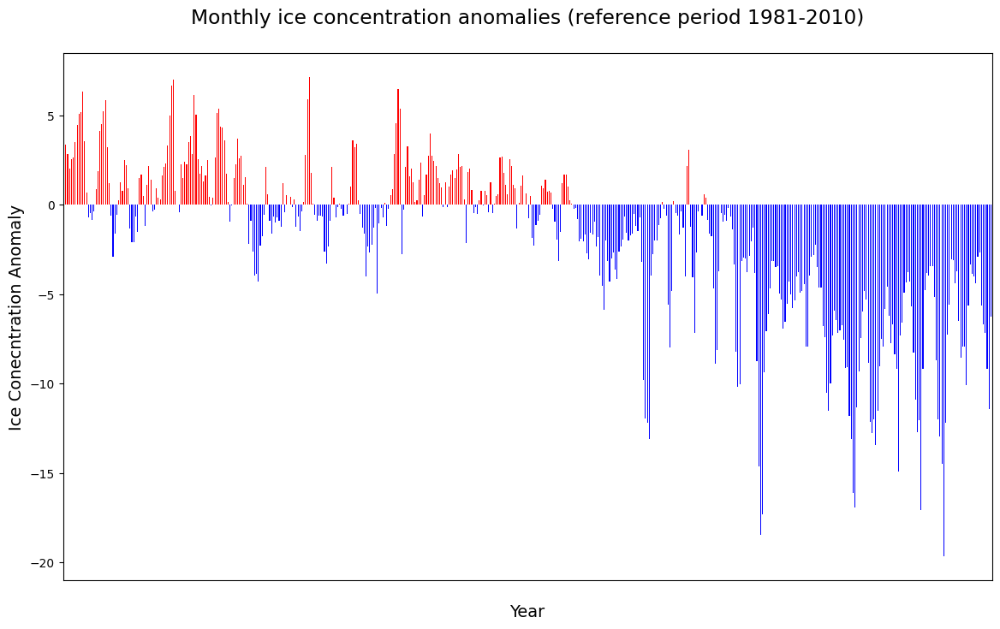

In [38]:
#@markdown ## Generate monthly global average anomaly

# Compute the weights and the weighted average
ice_weights = np.cos(np.deg2rad(ice_anomalies.icec.lat))
df = ice_anomalies.isel(lat=slice(0,24))
df = df.icec.weighted(ice_weights).mean(dim=['lat','lon']) # monthly global weighted average

df_year = df.groupby('time.year').mean() # annual global weighted average

# Convert to dataframe for display purpose
df = df.to_dataframe()
df_year = df_year.to_dataframe()

df['positive'] = df['icec'] > 0
df_year['positive'] = df_year['icec'] > 0

################################################################################

plt.rcParams.update({'font.size': 14}) # must set in top
ax = df['icec'].plot(figsize=(14,8),
               kind='bar',
               color=df.positive.map({True: 'red', False: 'blue'}),
               fontsize=10,
               xlabel='\nYear',
               xticks=[],
               ylabel='Ice Conecntration Anomaly',
               title='Monthly ice concentration anomalies (reference period 1981-2010)\n',
               )

Also as regards the concentration of ice, the difference is more significant in the summer months, but in this case, mostly negative anomalies are also noted in winter. Moreover, it is noted that in recent years the average monthly anomaly in the Arctic region has always been negative.

### Antarctica

Let's now do the same analysis focusing on the Antarctic region. It should be remembered that the seasons are reversed in the Arctic:

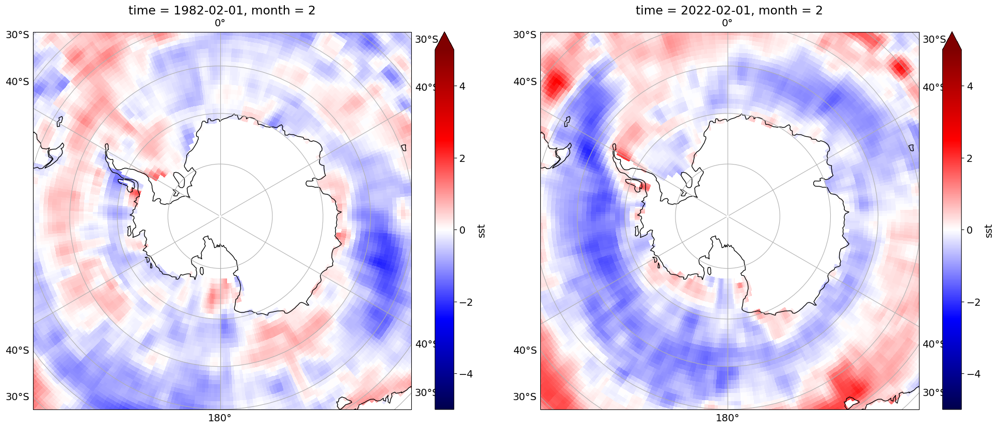

In [39]:
#@markdown ## Comparison between Antarctica summer: 1982 vs. 2022
#@markdown #### Antarctica summer is in February

extent = [180, -180, -50, -90]

proj = ccrs.Orthographic(central_longitude=0.0, central_latitude=-90)
fig, ax = plt.subplots(1, 2, figsize=(20, 8), subplot_kw={'projection': proj})
ax[0].set_extent(extent, ccrs.PlateCarree())
ax[1].set_extent(extent, ccrs.PlateCarree())

# 1982
sea_anomalies.sst.isel(time=2).plot(ax=ax[0], transform=ccrs.PlateCarree(),
                                              vmin=-5,
                                              vmax=5,
                                              cmap=mpl.cm.seismic)
ax[0].coastlines()
ax[0].gridlines(draw_labels=True)

# 2022
sea_anomalies.sst.isel(time=482).plot(ax=ax[1], transform=ccrs.PlateCarree(),
                                              vmin=-5,
                                              vmax=5,
                                              cmap=mpl.cm.seismic)
ax[1].coastlines()
ax[1].gridlines(draw_labels=True)

fig.tight_layout()

plt.show()
plt.close()

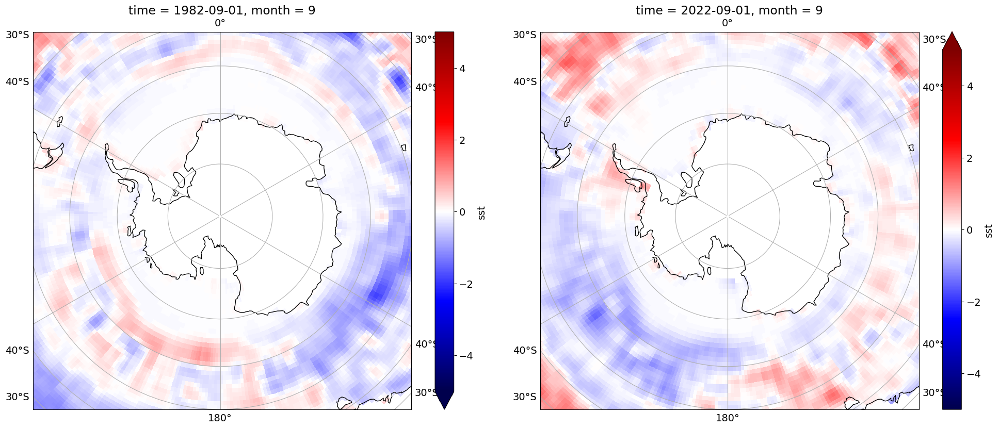

In [40]:
#@markdown ## Comparison between Antarctica winter: 1982 vs. 2022
#@markdown #### Antarctica summer is in September

extent = [180, -180, -50, -90]

proj = ccrs.Orthographic(central_longitude=0.0, central_latitude=-90)
fig, ax = plt.subplots(1, 2, figsize=(20, 8), subplot_kw={'projection': proj})
ax[0].set_extent(extent, ccrs.PlateCarree())
ax[1].set_extent(extent, ccrs.PlateCarree())

# 1982
sea_anomalies.sst.isel(time=9).plot(ax=ax[0], transform=ccrs.PlateCarree(),
                                              vmin=-5,
                                              vmax=5,
                                              cmap=mpl.cm.seismic)
ax[0].coastlines()
ax[0].gridlines(draw_labels=True)

# 2022
sea_anomalies.sst.isel(time=489).plot(ax=ax[1], transform=ccrs.PlateCarree(),
                                              vmin=-5,
                                              vmax=5,
                                              cmap=mpl.cm.seismic)
ax[1].coastlines()
ax[1].gridlines(draw_labels=True)

fig.tight_layout()

plt.show()
plt.close()

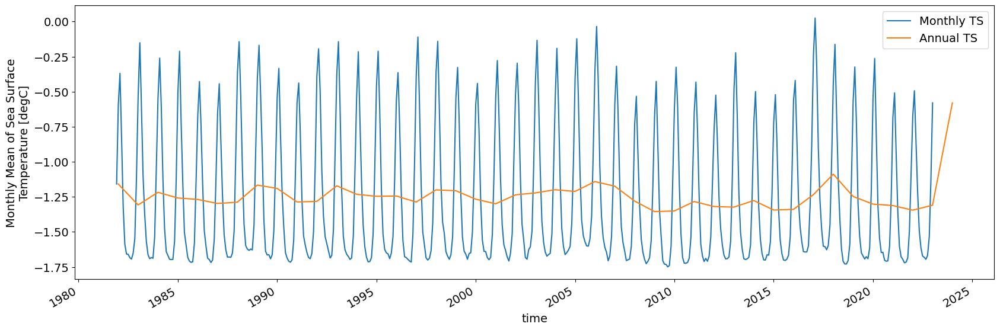

In [41]:
plt.figure(figsize=(20, 6))
antarctic_weighted = sea_data.isel(lat=slice(156,180)).sst.weighted(sst_weights).mean(("lon", "lat"), keep_attrs=True)

# Monthly weighted average time series
antarctic_weighted.plot()

# Annual weighted average time series
antarctic_weighted.resample(time="Y").mean().plot()

plt.legend(["Monthly TS", "Annual TS"], loc=0)
plt.show()

Both from the maps and from the time series, a clear pattern such as that of the Arctic area does not emerge. The temperature is generally lower but there is no evident increasing trend.

Now, ice concentration:

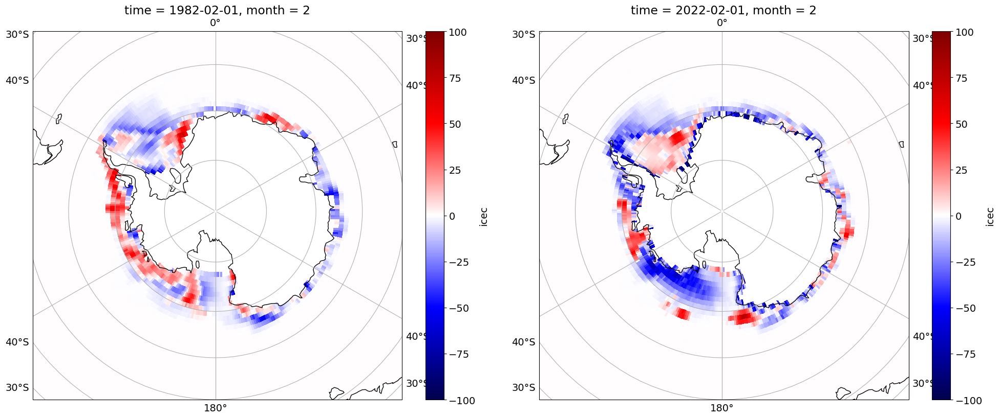

In [42]:
#@markdown ## Comparison between Antarctica summer: 1982 vs. 2022

extent = [180, -180, -50, -90]

proj = ccrs.Orthographic(central_longitude=0.0, central_latitude=-90)
fig, ax = plt.subplots(1, 2, figsize=(20, 8), subplot_kw={'projection': proj})
ax[0].set_extent(extent, ccrs.PlateCarree())
ax[1].set_extent(extent, ccrs.PlateCarree())

# 1982
ice_anomalies.icec.isel(time=2).plot(ax=ax[0], transform=ccrs.PlateCarree(),
                                              vmin=-100,
                                              vmax=100,
                                              cmap=mpl.cm.seismic)
ax[0].coastlines()
ax[0].gridlines(draw_labels=True)

# 2022
ice_anomalies.icec.isel(time=482).plot(ax=ax[1], transform=ccrs.PlateCarree(),
                                              vmin=-100,
                                              vmax=100,
                                              cmap=mpl.cm.seismic)
ax[1].coastlines()
ax[1].gridlines(draw_labels=True)

fig.tight_layout()

plt.show()
plt.close()

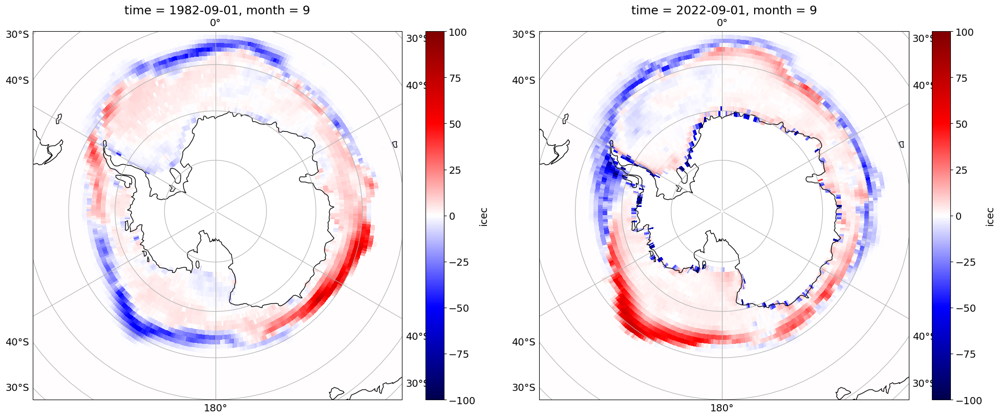

In [43]:
#@markdown ## Comparison between Antarctica winter: 1982 vs. 2022

extent = [180, -180, -50, -90]

proj = ccrs.Orthographic(central_longitude=0.0, central_latitude=-90)
fig, ax = plt.subplots(1, 2, figsize=(20, 8), subplot_kw={'projection': proj})
ax[0].set_extent(extent, ccrs.PlateCarree())
ax[1].set_extent(extent, ccrs.PlateCarree())

# 1982
ice_anomalies.icec.isel(time=9).plot(ax=ax[0], transform=ccrs.PlateCarree(),
                                              vmin=-100,
                                              vmax=100,
                                              cmap=mpl.cm.seismic)
ax[0].coastlines()
ax[0].gridlines(draw_labels=True)

# 2022
ice_anomalies.icec.isel(time=489).plot(ax=ax[1], transform=ccrs.PlateCarree(),
                                              vmin=-100,
                                              vmax=100,
                                              cmap=mpl.cm.seismic)
ax[1].coastlines()
ax[1].gridlines(draw_labels=True)

fig.tight_layout()

plt.show()
plt.close()

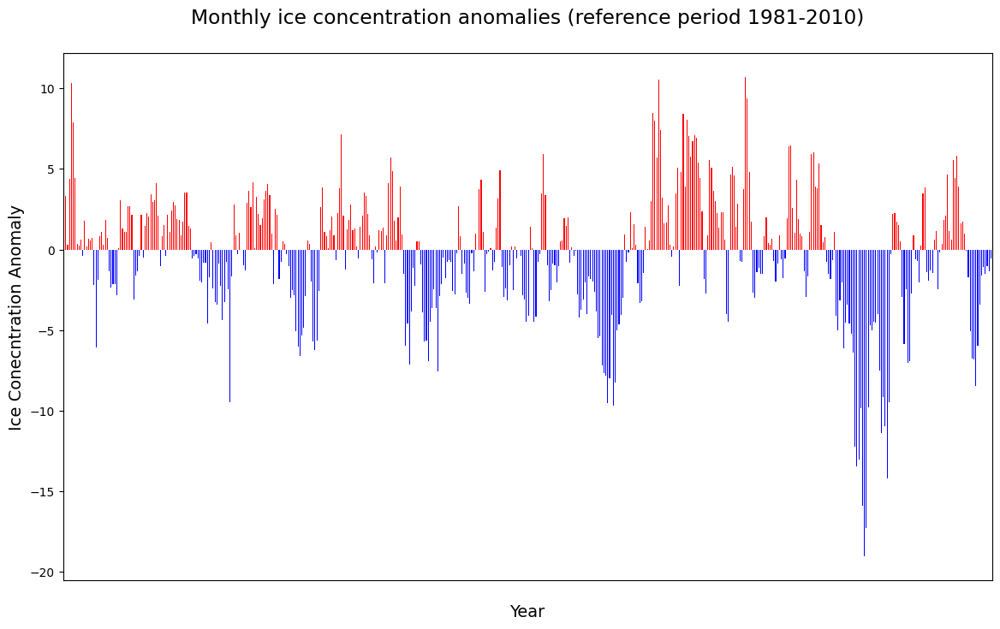

In [44]:
#@markdown ## Generate monthly global average anomaly

# Compute the weights and the weighted average
ice_weights = np.cos(np.deg2rad(ice_anomalies.icec.lat))
df = ice_anomalies.isel(lat=slice(156,180))
df = df.icec.weighted(ice_weights).mean(dim=['lat','lon']) # monthly global weighted average

df_year = df.groupby('time.year').mean() # annual global weighted average

# Convert to dataframe for display purpose
df = df.to_dataframe()
df_year = df_year.to_dataframe()

df['positive'] = df['icec'] > 0
df_year['positive'] = df_year['icec'] > 0

################################################################################

plt.rcParams.update({'font.size': 14}) # must set in top
ax = df['icec'].plot(figsize=(14,8),
               kind='bar',
               color=df.positive.map({True: 'red', False: 'blue'}),
               fontsize=10,
               xlabel='\nYear',
               xticks=[],
               ylabel='Ice Conecntration Anomaly',
               title='Monthly ice concentration anomalies (reference period 1981-2010)\n',
               )

As regards the concentration of ice, the trend is more evident. We wanted to show the comparison between February 1982 and 2022 as [February 2022 recorded historic lows in Antarctic ice extent](https://earthobservatory.nasa.gov/images/149627/antarctic-sea-ice-reaches-record-low). However, negative anomalies can be noted especially in the area strictly surrounding the emerged land, while positive anomalies can be noticed going into the open sea. As previously mentioned, the detachment of ice masses from the continental zone, and the consequent drift at sea, is a factor that has led to the lowering of the sea surface temperature in the Southern Ocean.

# Correlation between sea temperature and ice concentration

As a last analysis we want to try to give a quantitative measure of the dependence between sea temperature and ice concentration.

In [45]:
# I have to remove the last two observation for the sea temperature dataset
sea_data = sea_data.sel(time=slice('1981-12-01', '2022-11-01')) 

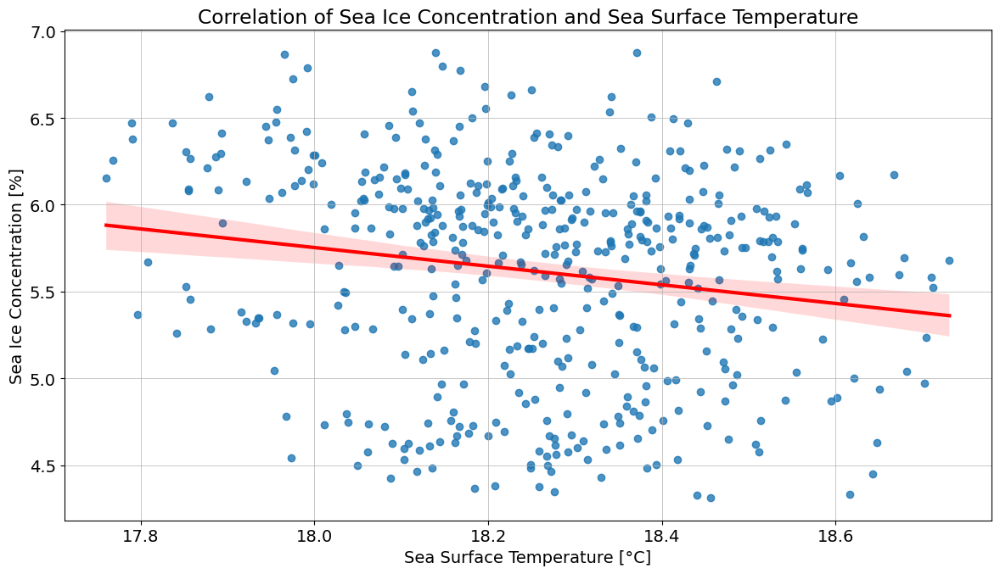

In [46]:
fig, ax = plt.subplots(figsize=(12, 7))
sns.regplot(x=sea_data.sst.weighted(sst_weights).mean(dim=['lat', 'lon']),
            y=ice_data.icec.weighted(ice_weights).mean(dim=['lat', 'lon']), 
            fit_reg=True,
            line_kws={"linewidth": 3, "color": "red"})
ax.grid(linewidth=0.5)
ax.set_ylabel('Sea Ice Concentration [%]')
ax.set_xlabel('Sea Surface Temperature [°C]')
ax.set_title('Correlation of Sea Ice Concentration and Sea Surface Temperature')
plt.tight_layout()

Considering all the global data we can see a negative correlation, a sign of how the surface temperature of the seas is a factor responsible for the decrease in ice concentration.

As we did before, however, our main interest is on the poles.

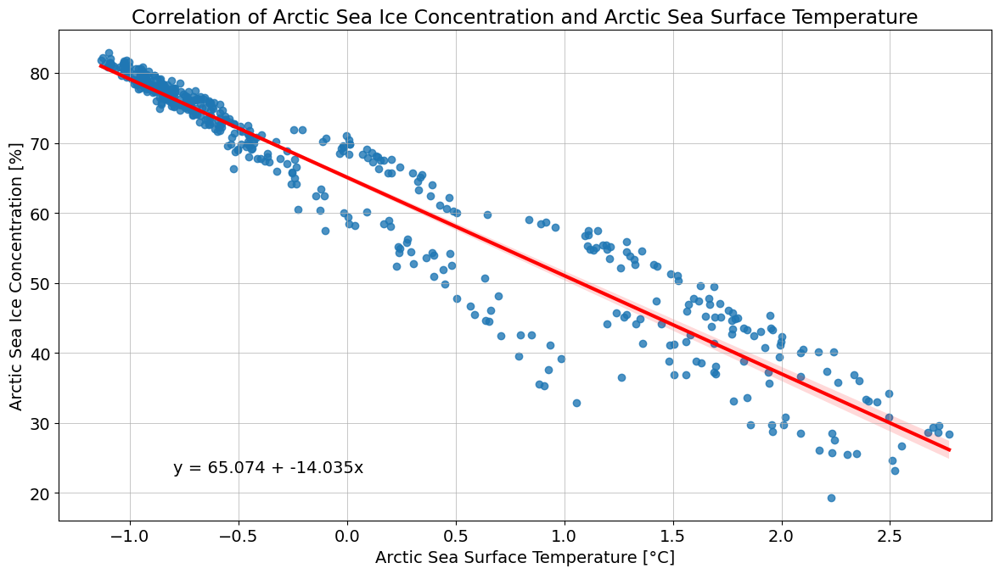

In [47]:
fig, ax = plt.subplots(figsize=(12, 7))
ax = sns.regplot(x=sea_data.isel(lat=slice(0,24)).sst.weighted(sst_weights).mean(dim=['lat', 'lon']),
            y=ice_data.isel(lat=slice(0,24)).icec.weighted(ice_weights).mean(dim=['lat', 'lon']), 
            fit_reg=True,
            line_kws={"linewidth": 3, "color": "red"})
ax.grid(linewidth=0.5)
ax.set_ylabel('Arctic Sea Ice Concentration [%]')
ax.set_xlabel('Arctic Sea Surface Temperature [°C]')
ax.set_title('Correlation of Arctic Sea Ice Concentration and Arctic Sea Surface Temperature')

# Compute slope and intercept of regression equation
slope, intercept, r, p, sterr = scipy.stats.linregress(x=ax.get_lines()[0].get_xdata(),
                                                       y=ax.get_lines()[0].get_ydata())

# Add regression equation to plot
plt.text(-0.8, 23, 'y = ' + str(round(intercept,3)) + ' + ' + str(round(slope,3)) + 'x')

plt.tight_layout()

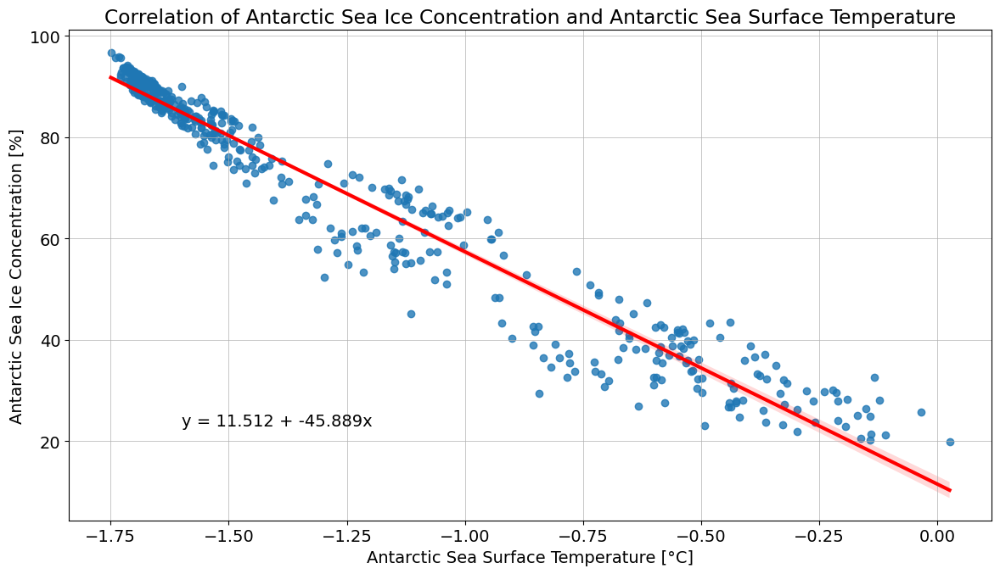

In [66]:
fig, ax = plt.subplots(figsize=(12, 7))
ax = sns.regplot(x=sea_data.isel(lat=slice(156,180)).sst.weighted(sst_weights).mean(dim=['lat', 'lon']),
            y=ice_data.isel(lat=slice(156,180)).icec.weighted(ice_weights).mean(dim=['lat', 'lon']), 
            fit_reg=True,
            line_kws={"linewidth": 3, "color": "red"})
ax.grid(linewidth=0.5)
ax.set_ylabel('Antarctic Sea Ice Concentration [%]')
ax.set_xlabel('Antarctic Sea Surface Temperature [°C]')
ax.set_title('Correlation of Antarctic Sea Ice Concentration and Antarctic Sea Surface Temperature')

# Compute slope and intercept of regression equation
slope, intercept, r, p, sterr = scipy.stats.linregress(x=ax.get_lines()[0].get_xdata(),
                                                       y=ax.get_lines()[0].get_ydata())

# Add regression equation to plot
plt.text(-1.6, 23, 'y = ' + str(round(intercept,3)) + ' + ' + str(round(slope,3)) + 'x')

plt.tight_layout()

Limiting ourselves to the Arctic and Antarctica, we can see how this correlation is much more accentuated. The regression lines show how the ice concentration is strongly sensitive to temperature variations. In Antarctica, in particular, the slightest variations in temperature correspond to large variations in the concentration of ice.

In [49]:
corr, _ = pearsonr(sea_data.sst.weighted(sst_weights).mean(dim=['lat', 'lon']), 
                   ice_data.icec.weighted(ice_weights).mean(dim=['lat', 'lon']))
print('Pearsons correlation: %.3f' %corr)

Pearsons correlation: -0.174


In [50]:
corr, _ = pearsonr(sea_data.isel(lat=slice(0,24)).sst.weighted(sst_weights).mean(dim=['lat', 'lon']), 
                   ice_data.isel(lat=slice(0,24)).icec.weighted(ice_weights).mean(dim=['lat', 'lon']))
print('Pearsons correlation: %.3f' %corr)

Pearsons correlation: -0.963


In [51]:
corr, _ = pearsonr(sea_data.isel(lat=slice(156,180)).sst.weighted(sst_weights).mean(dim=['lat', 'lon']), 
                   ice_data.isel(lat=slice(156,180)).icec.weighted(ice_weights).mean(dim=['lat', 'lon']))
print('Pearsons correlation: %.3f' %corr)

Pearsons correlation: -0.976


# Time series forecast

Now that we know the relationship between these two quantities qualitatively, we can try to predict the future trend of the time series considered to try to estimate the future evolution of the ice concentration in the areas of our interest.

To do the analysis, I will use the [Prophet method](https://facebook.github.io/prophet/). 

### Arctic

In [52]:
sea_arctic = sea_data.isel(lat=slice(0,24)).sst.weighted(sst_weights).mean(("lon", "lat"), keep_attrs=True)
sea_arctic = sea_arctic.to_dataframe()
sea_arctic = sea_arctic.reset_index()
sea_arctic = sea_arctic[['time', 'sst']]
sea_arctic = sea_arctic.drop_duplicates()
sea_arctic.rename(columns = {'time':'ds', 'sst':'y'}, inplace = True)

In [53]:
# Model fit
model = Prophet(seasonality_mode='multiplicative').fit(sea_arctic)

# Prediction steps
future = model.make_future_dataframe(periods=332, freq='M')  # predictions 28 years ahead

# Make the predicions
future_predictions = model.predict(future)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_adyo98r/tekg5l5n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_adyo98r/n0zkeovp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32196', 'data', 'file=/tmp/tmp_adyo98r/tekg5l5n.json', 'init=/tmp/tmp_adyo98r/n0zkeovp.json', 'output', 'file=/tmp/tmp_adyo98r/prophet_modelq8l9f7_d/prophet_model-20230530131223.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:12:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:12:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


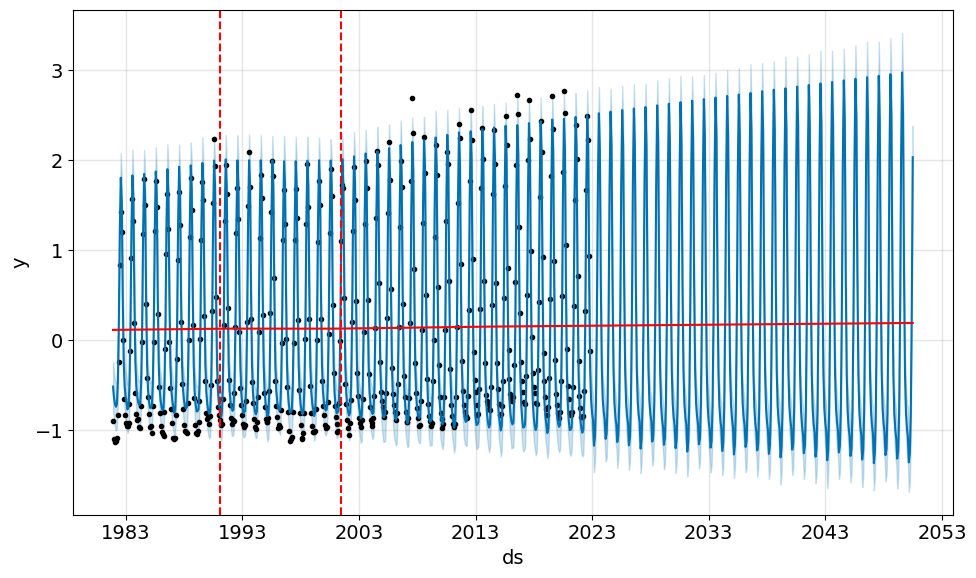

In [54]:
# Visualization
fig = model.plot(future_predictions)
a = add_changepoints_to_plot(fig.gca(), model, future_predictions)

Prophet is a simple method to use and generally easy to interpret. However, it is not particularly suitable for highlighting unexpected external events and in some cases fails to give accurate predictions. Despite this, in our case it is a useful tool to get an idea of ​​the possible future trend. As shown in the forecast above, the trend would lead to temperatures of around 3°C in the Arctic region around 2050. If this were the case, according to the relationship previously extracted, in the middle of this century we could get to have a north pole with less than 20% ice coverage.

### Antarctic

In [55]:
sea_antarctic = sea_data.isel(lat=slice(156,180)).sst.weighted(sst_weights).mean(("lon", "lat"), keep_attrs=True)
sea_antarctic = sea_antarctic.to_dataframe()
sea_antarctic = sea_antarctic.reset_index()
sea_antarctic = sea_antarctic[['time', 'sst']]
sea_antarctic = sea_antarctic.drop_duplicates()
sea_antarctic.rename(columns = {'time':'ds', 'sst':'y'}, inplace = True)

In [56]:
# Model fit
model2 = Prophet(seasonality_mode='multiplicative').fit(sea_antarctic)

# Prediction steps
future2 = model2.make_future_dataframe(periods=332, freq='M')  # predictions 28 years ahead

# Make the predicions
future_predictions_2 = model2.predict(future2)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_adyo98r/tf_c3zir.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_adyo98r/ie1imz9a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2695', 'data', 'file=/tmp/tmp_adyo98r/tf_c3zir.json', 'init=/tmp/tmp_adyo98r/ie1imz9a.json', 'output', 'file=/tmp/tmp_adyo98r/prophet_model87zskfzh/prophet_model-20230530131224.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:12:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:12:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


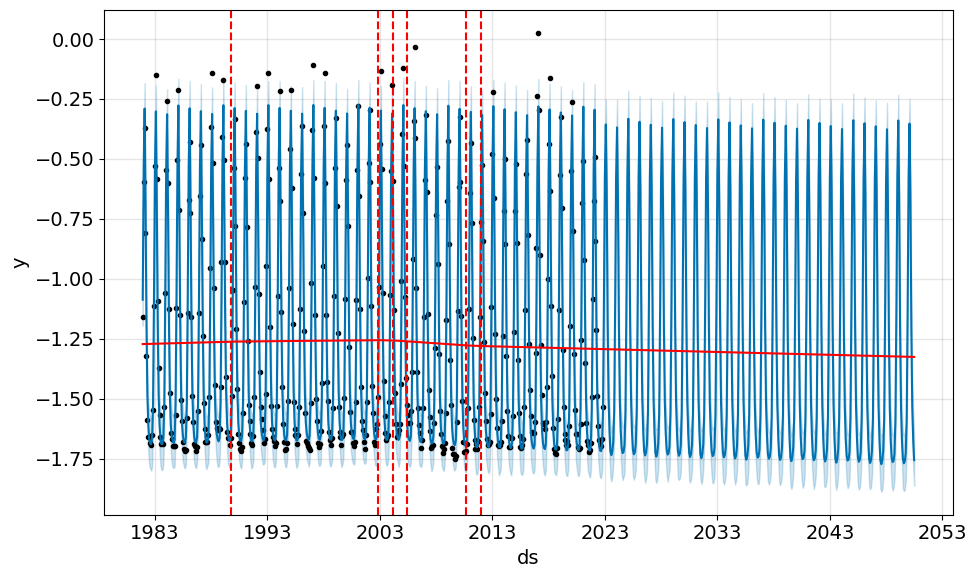

In [57]:
# Visualization
fig = model2.plot(future_predictions_2)
a = add_changepoints_to_plot(fig.gca(), model2, future_predictions_2)

They look to the Antarctic continent, the trend is much less evident. Although the model suggests a slightly increasing trend in the future, we see how the temperature peaks do not seem to grow in a particular way. However, if we focus on the time series of ice concentration:

In [58]:
ice_antarctic = ice_data.isel(lat=slice(156,180)).icec.weighted(sst_weights).mean(("lon", "lat"), keep_attrs=True)
ice_antarctic = ice_antarctic.to_dataframe()
ice_antarctic = ice_antarctic.reset_index()
ice_antarctic = ice_antarctic[['time', 'icec']]
ice_antarctic = ice_antarctic.drop_duplicates()
ice_antarctic.rename(columns = {'time':'ds', 'icec':'y'}, inplace = True)

In [59]:
# Model fit
model_ice = Prophet(seasonality_mode='multiplicative').fit(ice_antarctic)

# Prediction steps
future_ice = model_ice.make_future_dataframe(periods=332, freq='M')  # predictions 28 years ahead

# Make the predicions
future_predictions_ice = model_ice.predict(future_ice)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_adyo98r/cz2usbjl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_adyo98r/frle1bnk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98903', 'data', 'file=/tmp/tmp_adyo98r/cz2usbjl.json', 'init=/tmp/tmp_adyo98r/frle1bnk.json', 'output', 'file=/tmp/tmp_adyo98r/prophet_modelp8gemkp2/prophet_model-20230530131226.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:12:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:12:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


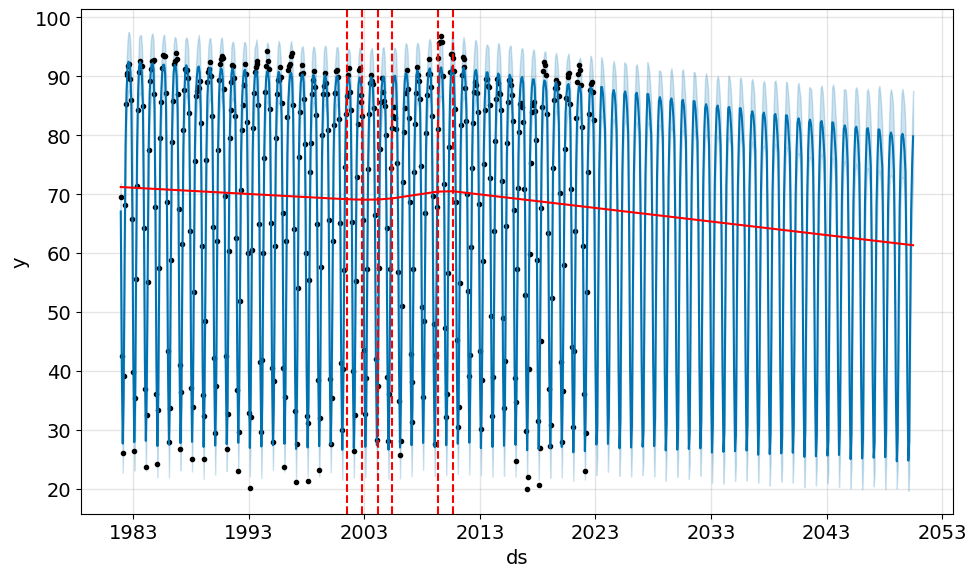

In [60]:
# Visualization
fig = model_ice.plot(future_predictions_ice)
a = add_changepoints_to_plot(fig.gca(), model_ice, future_predictions_ice)

A much sharper decreasing trend can be seen. This characteristic relationship of the Antarctic continent could be due to the fact that in this geographical region the ice concentration is much more sensitive to sea temperature changes, as shown by the correlation above: therefore, even minimal variations in temperature can lead to evident effects in terms of ice masses.

# References



*   [Class exercises: plots, maps, time series, etc.](https://elearning.unimib.it/course/view.php?id=44552)
*   [Linear correlation](https://www.statology.org/seaborn-regplot-equation/)
*   [Prophet method](https://facebook.github.io/prophet/docs/quick_start.html)

